<a href="https://colab.research.google.com/github/ilanb1/IR2rgb-project/blob/main/ir2rgb_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Coloring Infrared (IR) images

In this notebook, we will try to apply the Pix2pix algorithm for coloring IR images.
IR images are single-channel images (black-and-white images), although the information in them is not the same as the black-and-white image that was converted from the original color image. Some of the information is lost, and some parts appear only in the IR image that cannot be seen even in the original color image.
Therefore, the transition IR_to_rgb is more difficult than BW_to_rgb.
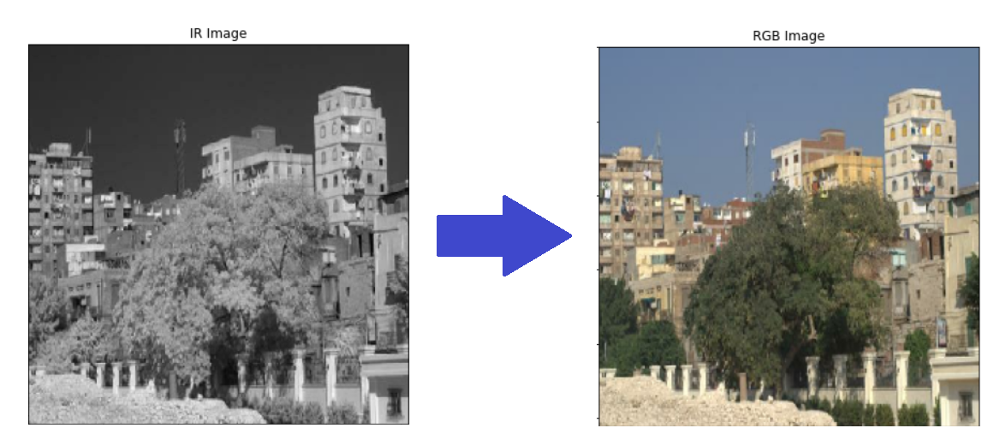

The implementation is according to the TensorFlow tutorial for pix2pix:
https://www.tensorflow.org/tutorials/generative/pix2pix?hl=en
with slight modifications to match our single channel input.


importing libraries:


In [ ]:
import tensorflow as tf
import cv2
import matplotlib.pyplot as plt
import os
import numpy as np
import imageio
import time
from IPython import display

mounting to google drive:

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Creating the training and validation datasets from the folder in my google drive.
The images were downloaded from: 
https://ivrlwww.epfl.ch/supplementary_material/cvpr11/index.html

In [ ]:
image_height = 798
image_width = 1182
images_path = '/content/drive/MyDrive/IR dataset/IR project/new data set'

training_ds = tf.keras.utils.image_dataset_from_directory(
    directory = images_path,
    labels=None,
    label_mode=None,
    batch_size=None,
    image_size=(image_height, image_width),
    shuffle=True,
    seed=119,
    validation_split=0.1,
    subset="training",
)

validation_ds = tf.keras.utils.image_dataset_from_directory(
    directory = images_path,
    labels=None,
    label_mode=None,
    batch_size=None,
    image_size=(image_height, image_width),
    shuffle=True,
    seed=119,
    validation_split=0.1,
    subset="validation",
)

Found 477 files belonging to 1 classes.
Using 430 files for training.
Found 477 files belonging to 1 classes.
Using 47 files for validation.


#Exploring the dataset:

image shape: (798, 1182, 3)
image max value: 255.0, min value: 0.0
image data type: <dtype: 'float32'>


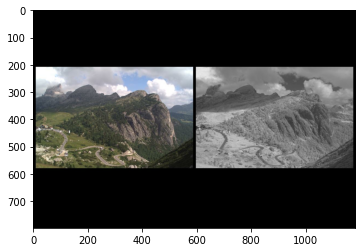

In [ ]:
#plotting 1 image and its info
image = list(training_ds.take(1))[0]
print(f"image shape: {image.shape}")
print(f"image max value: {np.max(image)}, min value: {np.min(image)}")
print(f"image data type: {image.dtype}")
plt.imshow(tf.cast(image,"int64"))

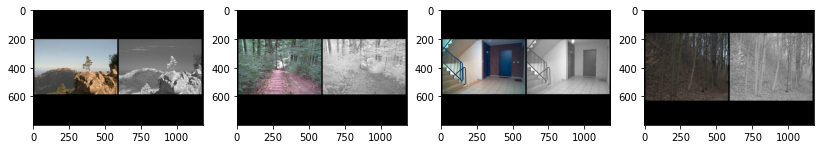

In [ ]:
#more images:
fig, arr = plt.subplots(1, 4, figsize=(14, 10))

for index, image in enumerate(training_ds.take(4)):
  arr[index].imshow(tf.cast(image,"int64"))

We see that each element in our dataset is one image that consists of both the IR image and the RGB image, so we will need to crop from it two separate images.

Some functions to preprocess the dataset:

In [ ]:
# The training set consist of 430 images
BUFFER_SIZE = 430
# The batch size of 1 produced better results for the U-Net in the original pix2pix experiment
BATCH_SIZE = 1
# Each image is 256x256 in size
IMG_WIDTH = 256
IMG_HEIGHT = 256

#splits each image to the rgb image and the IR image
def split_images(image):
  rgb = image[202:585, 10:586, :]
  IR = image[202:585, 596:1172, :]
  # Convert both images to float32 tensors
  rgb = tf.cast(rgb, tf.float32)
  IR = tf.cast(IR, tf.float32)

  return IR , rgb

def show_images(real , IR):
  real = real * 0.5 + 0.5
  IR = IR * 0.5 + 0.5
  fig, arr = plt.subplots(1, 2, figsize=(14, 10))
  arr[0].imshow(real)
  arr[0].set_title('RGB Image')
  arr[1].imshow(IR, cmap="gray")
  arr[1].set_title('IR Image')

# Normalizing the images to [-1, 1]
def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return input_image, real_image

def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [height, width], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image, real_image

def random_crop(input_image, real_image):
  stacked_image = tf.stack([input_image, real_image], axis=0)
  cropped_image = tf.image.random_crop(stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image[0], cropped_image[1]

@tf.function()
def random_jitter(input_image, real_image):
  # Resizing to 286x286
  input_image, real_image = resize(input_image, real_image, 286, 286)

  # Random cropping back to 256x256
  input_image, real_image = random_crop(input_image, real_image)

  if tf.random.uniform(()) > 0.5:
    # Random mirroring
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)

  return input_image, real_image

#Building the input pipeline

In [ ]:
def load_image_train(image_file):
  input_image, real_image = split_images(image_file)
  input_image, real_image = random_jitter(input_image, real_image)
  input_image, real_image = normalize(input_image, real_image)
  input_image = tf.reshape(input_image[...,0],[IMG_HEIGHT, IMG_WIDTH,1])
  return input_image, real_image

def load_image_test(image_file):
  input_image, real_image = split_images(image_file)
  input_image, real_image = resize(input_image, real_image, IMG_HEIGHT, IMG_WIDTH)
  input_image, real_image = normalize(input_image, real_image)
  input_image = tf.reshape(input_image[...,0],[IMG_HEIGHT, IMG_WIDTH,1])
  return input_image, real_image

In [ ]:
training_ds = training_ds.map(load_image_train, num_parallel_calls=tf.data.AUTOTUNE)
training_ds = training_ds.cache()
training_ds = training_ds.shuffle(BUFFER_SIZE)
training_ds = training_ds.batch(BATCH_SIZE)
training_ds = training_ds.prefetch(tf.data.AUTOTUNE)

validation_ds = validation_ds.map(load_image_test)
validation_ds = validation_ds.batch(BATCH_SIZE)

checking again to ensure correct form of the images:

shape of rgb image: (1, 256, 256, 3)
shape of IR image: (1, 256, 256, 1)
rgb image; max value: 1.0 , min value: -1.0
IR image; max value: 1.0 , min value: -0.843137264251709


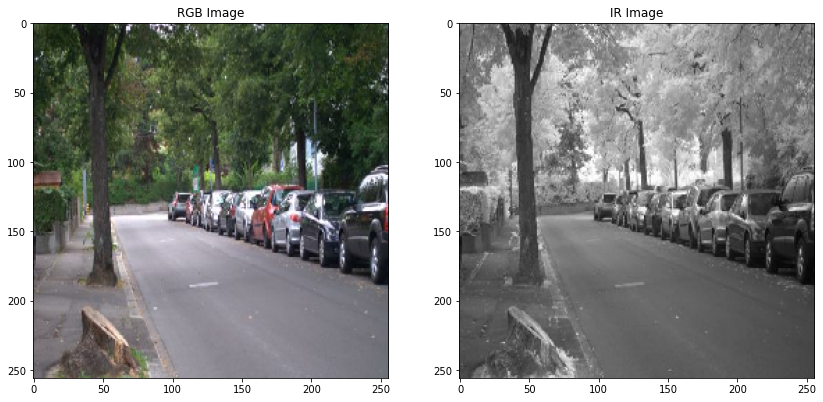

In [ ]:
for IR , rgb in training_ds.take(1):
  print(f"shape of rgb image: {rgb.shape}")
  print(f"shape of IR image: {IR.shape}")
  print(f"rgb image; max value: {np.max(rgb)} , min value: {np.min(rgb)}")
  print(f"IR image; max value: {np.max(IR)} , min value: {np.min(IR)}")
  show_images(tf.squeeze(rgb), tf.squeeze(IR))

# Building the generator
functions for building the generator:

In [ ]:
OUTPUT_CHANNELS = 3

def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

In [ ]:
#testing cell

test_image = IR
down_model = downsample(3, 4)
down_result = down_model(test_image)
print (down_result.shape)

up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)

(1, 128, 128, 3)
(1, 256, 256, 3)


Creating the Generator:

In [ ]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[256, 256, 1]) #to match our images

  down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
    downsample(128, 4),  # (batch_size, 64, 64, 128)
    downsample(256, 4),  # (batch_size, 32, 32, 256)
    downsample(512, 4),  # (batch_size, 16, 16, 512)
    downsample(512, 4),  # (batch_size, 8, 8, 512)
    downsample(512, 4),  # (batch_size, 4, 4, 512)
    downsample(512, 4),  # (batch_size, 2, 2, 512)
    downsample(512, 4),  # (batch_size, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
    upsample(512, 4),  # (batch_size, 16, 16, 1024)
    upsample(256, 4),  # (batch_size, 32, 32, 512)
    upsample(128, 4),  # (batch_size, 64, 64, 256)
    upsample(64, 4),  # (batch_size, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (batch_size, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

In [ ]:
generator = Generator()
#generator.summary()

In [ ]:
#tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

(1, 256, 256, 1)


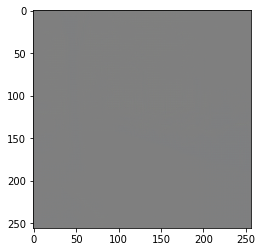

In [ ]:
#testing cell
print(test_image.shape)                      
gen_output = generator(test_image  , training=False)
plt.imshow(tf.cast(gen_output[0], tf.float32)*0.5+0.5)

In [ ]:
LAMBDA = 100
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # Mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

#Building the discriminator
Creating the Discriminator:

In [ ]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 1], name='input_image') #IR image got 1 channel only
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x)  # (batch_size, 128, 128, 64)
  down2 = downsample(128, 4)(down1)  # (batch_size, 64, 64, 128)
  down3 = downsample(256, 4)(down2)  # (batch_size, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

In [ ]:
discriminator = Discriminator()
#tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

(1, 30, 30, 1)


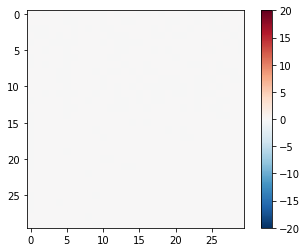

In [ ]:
#testing cell
disc_out = discriminator([test_image, gen_output], training=False)
print(disc_out.shape)
plt.imshow(disc_out[0, ..., -1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

In [ ]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

Optimizers for the generator and the discriminator:

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

checkpoints (just to save the models later):

In [ ]:
checkpoint_dir = '/content/drive/MyDrive/IR dataset/IR project/checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

function to plot the triplet:

*   input (IR image)
*   target (rgb image)
*   prediction (generated rgb image from the IR image)

In [ ]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  rgb = tar[0] * 0.5 + 0.5
  IR = tf.squeeze(test_input) * 0.5 +0.5
  generated = prediction[0] * 0.5 + 0.5
  
  plt.figure(figsize=(15, 15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']
  plt.subplot(1,3,1)
  plt.title("IR image (Input)")
  plt.imshow(IR, cmap="gray")
  plt.axis('off')
  
  plt.subplot(1,3,2)
  plt.title('Real RGB Image (Ground Truth)')
  plt.imshow(rgb)
  plt.axis('off')

  plt.subplot(1,3,3)
  plt.title('Generated RGB Image (Prediction)')
  plt.imshow(generated)
  plt.axis('off')
  
  plt.show()

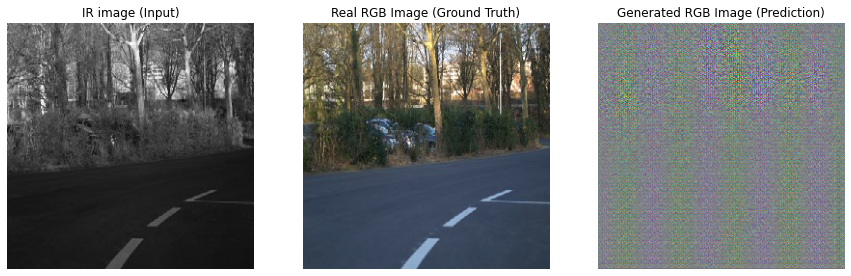

In [ ]:
#testing the above function
for example_input, example_target in training_ds.take(1):
  generate_images(generator, example_input, example_target)

#Training


In [ ]:
@tf.function
def train_step(input_image, target, step):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss, generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))

In [ ]:
def fit(train_ds, test_ds, steps):
  example_input, example_target = next(iter(test_ds.take(1)))
  start = time.time()
  for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
    if (step) % 1000 == 0:
      display.clear_output(wait=True)

      if step != 0:
        print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

      start = time.time()

      generate_images(generator, example_input, example_target)
      print(f"Step: {step//1000}k")

    train_step(input_image, target, step)

    # Training step
    if (step+1) % 10 == 0:
      print('.', end='', flush=True)


    # Save (checkpoint) the model every 5k steps
    # if (step + 1) % 5000 == 0:
    #   checkpoint.save(file_prefix=checkpoint_prefix)

Running the training loop:

In [ ]:
#THE TRAINING CELL, UNCOMMENT THE LINE BELOW TO TRAIN THE GAN

#fit(training_ds, validation_ds, steps=20000)

#Testing the results
Running the generator on few examples from the validation set:

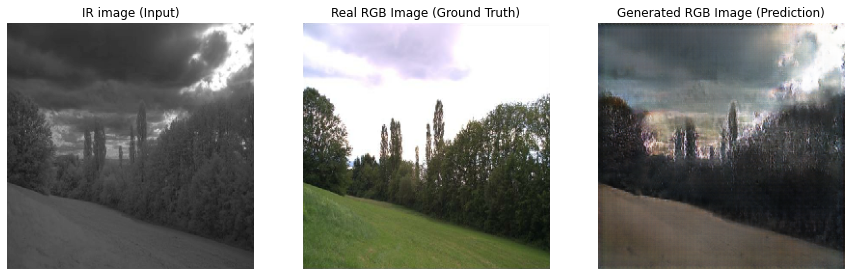

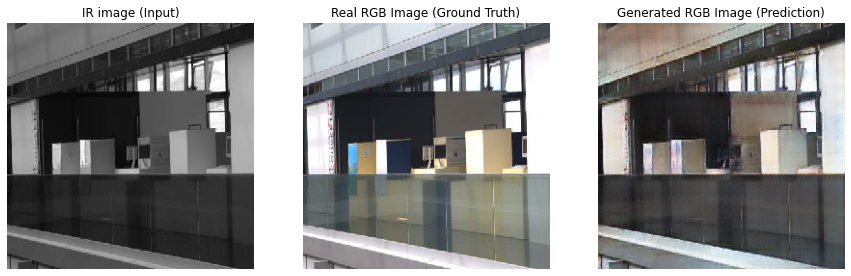

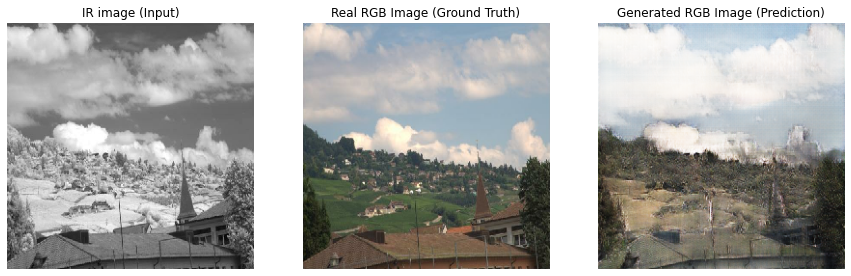

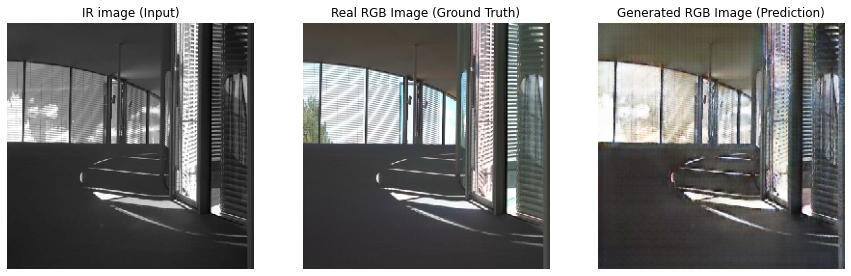

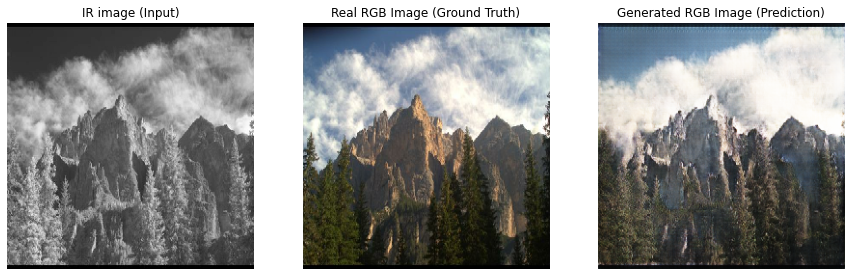

...

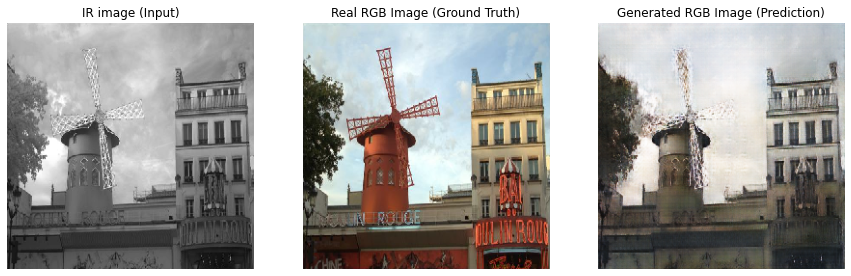

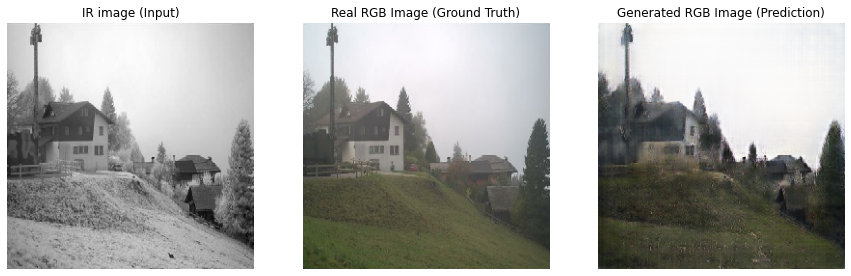

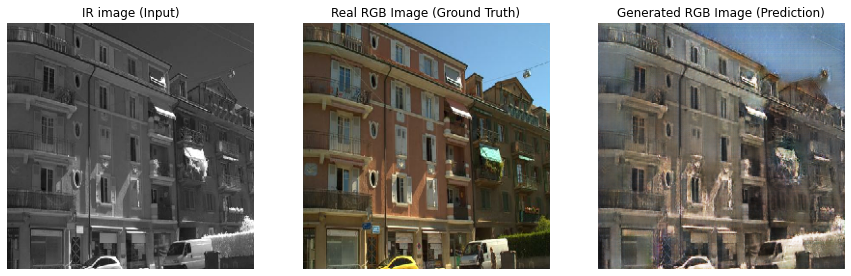

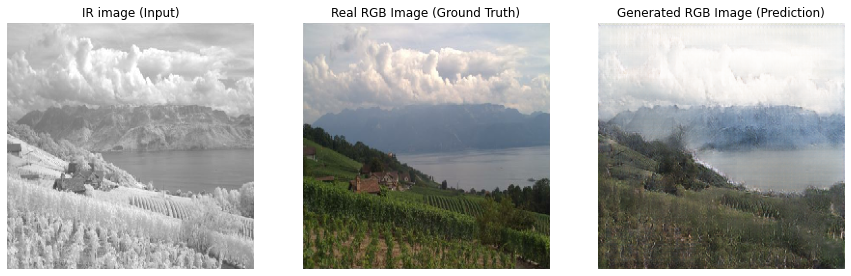

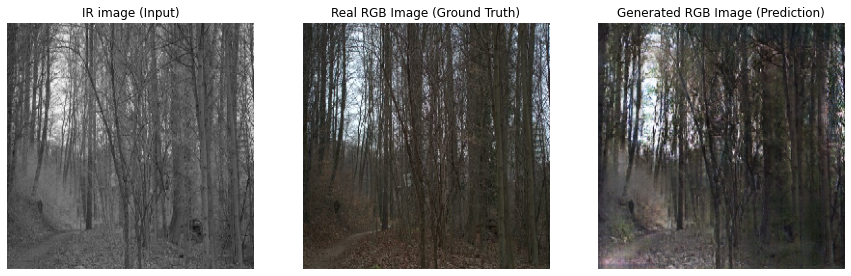

In [ ]:
for example_input, example_target in validation_ds.take(25):
  generate_images(generator, example_input, example_target)

In [ ]:
# save the progress (uncomment the line below)

#checkpoint.save(file_prefix=checkpoint_prefix)

In [ ]:
#load checkpoint (uncomment the line below)

#checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))


#Summary

* In terms of color: it seems that the model did learn basic things such as that the vegetation should be green and the sky should be blue, but at the same time the colors are less "vivid" compared to the original image.

* The generated image looks like the original RGB image with a lot of noise.

* The dataset contained too few images and was not colorful enough

* The training is quite slow, for every thousand steps it takes 3 minutes (with GPU), and it takes about 20 - 40 thousand steps for the training.  so, it is difficult to train several times to test different sets of hyperparameters.
